# ESPosition Evaluation

In [44]:
target_macs = [ 
    "20f094118214", # Pixel
    "d81c79de34e1", # iPhone
    "342eb61ec446" # P20
]

monitor_macs_esp8266 = [
    "483fda467e7a",
    "d8bfc0117c7d",
    "24a1602ccfab",
    "a4cf12fdaea9",
]

monitor_macs_esp32 = [
    "a0a3b3ff35c0",
    "f8b3b734347c",
    "a0a3b3ff66b4",
    "08a6f7a1e5c8",
    "f8b3b732fb6c",
    "f8b3b73303e8",
]

monitor_macs_all = monitor_macs_esp8266 + monitor_macs_esp32

## Prepare the data

In [27]:
import os
import pandas as pd
import re

# Define input and output base directories
input_base = "./data/original"
output_base = "./data/filtered"

# Regular expression to match and strip date prefixes
date_pattern = r"^\d{4}_\d{2}_\d{2}_\d{2}_\d{2}_\d{2}_"

def replace_macs(df):
    mac_replacements = {
        "f6049f6df5e6": "20f094118214"
    }
    columns = ["monitor_mac", "target_mac"]
    for col in columns:
        df[col] = df[col].replace(mac_replacements)

    return df

def filter_target_macs(df):
    return df[df["target_mac"].isin(target_macs)]

# Walk through each subfolder in the input directory
for subfolder in os.listdir(input_base):
    input_folder = os.path.join(input_base, subfolder)
    
    # Ensure it's a directory
    if os.path.isdir(input_folder):
        output_folder = os.path.join(output_base, subfolder)
        
        # Create the output subfolder if it doesn't exist
        os.makedirs(output_folder, exist_ok=True)
        
        # Process all CSV files in the current subfolder
        for filename in os.listdir(input_folder):
            if filename.endswith(".csv"):
                input_file_path = os.path.join(input_folder, filename)
                print(f"Processing: {input_file_path}")
                
                # Read the CSV file
                df = pd.read_csv(input_file_path)

                df = replace_macs(df)
                df = filter_target_macs(df)
                
                # Remove the date prefix from the filename
                cleaned_filename = re.sub(date_pattern, "", filename)
                
                # Define the output file path
                output_file_path = os.path.join(output_folder, cleaned_filename)
                
                # Save the processed file
                df.to_csv(output_file_path, index=False)
                print(f"Saved: {output_file_path}")

print("Processing complete.")

Processing: ./data/original\apb\2024_12_11_12_48_56_Pixel9.csv
Saved: ./data/filtered\apb\Pixel9.csv
Processing: ./data/original\apb\2024_12_12_10_17_51_iPhone.csv
Saved: ./data/filtered\apb\iPhone.csv
Processing: ./data/original\apb\2024_12_12_10_43_30_P20_Pro.csv
Saved: ./data/filtered\apb\P20_Pro.csv
Processing: ./data/original\apb\2024_12_12_11_31_48_Pixel9_eval.csv
Saved: ./data/filtered\apb\Pixel9_eval.csv
Processing: ./data/original\apb\2024_12_12_11_54_13_iPhone_eval.csv
Saved: ./data/filtered\apb\iPhone_eval.csv
Processing: ./data/original\apb\2024_12_12_12_20_42_P20_Pro_eval.csv
Saved: ./data/filtered\apb\P20_Pro_eval.csv
Processing: ./data/original\apb\2024_12_12_13_04_53_Pixel9_path_youtube.csv
Saved: ./data/filtered\apb\Pixel9_path_youtube.csv
Processing: ./data/original\apb\2024_12_12_13_08_00_Pixel9_path_spotify.csv
Saved: ./data/filtered\apb\Pixel9_path_spotify.csv
Processing: ./data/original\apb\2024_12_12_13_12_20_Pixel9_path_standby.csv
Saved: ./data/filtered\apb\Pix

## General Information

In [51]:
def get_unique_points_(file_path, x_col, y_col, filter_col=None):
    # Load the CSV file
    df = pd.read_csv(file_path)

    # Extract the distinct points as a set of tuples
    if filter_col is not None:
        distinct_df = df[[filter_col, x_col, y_col]]
    else:
        distinct_df = df[[x_col, y_col]]

    distinct_df = distinct_df.drop_duplicates()
    
    # Sort by y coordinate, then by x coordinate
    sorted_df = distinct_df.sort_values(by=[y_col, x_col]).reset_index(drop=True)
    
    # Print all distinct points
    return sorted_df

### APB

In [52]:
print("All Anchor Positions:\n")
get_unique_points_("./data/filtered/apb/Pixel9.csv", "anchor_position_x", "anchor_position_y", "monitor_mac")

All Anchor Positions:



,monitor_mac,anchor_position_x,anchor_position_y
0,08a6f7a1e5c8,884,45
1,483fda467e7a,1461,241
2,f8b3b732fb6c,1461,241
3,a4cf12fdaea9,861,580
4,f8b3b73303e8,861,580
5,d8bfc0117c7d,107,884
6,a0a3b3ff66b4,107,884
7,f8b3b734347c,1047,884
8,24a1602ccfab,2048,884
9,a0a3b3ff35c0,2048,884


In [53]:
print("All Fingerprint Positions:\n")
get_unique_points_("./data/filtered/apb/Pixel9.csv", "target_position_x", "target_position_y")

All Fingerprint Positions:



,target_position_x,target_position_y
0,937.642325,94.047389
1,1338.291192,94.047389
2,1148.736890,161.540208
3,1338.291192,290.781779
4,939.078343,292.217796
5,1336.855175,490.388203
6,939.078343,491.824221
7,1138.684768,493.260238
8,1062.575843,652.658175
9,881.637645,781.899745


### Flat

In [54]:
print("All Anchor Positions:\n")
get_unique_points_("./data/filtered/flat/Pixel9.csv", "anchor_position_x", "anchor_position_y", "monitor_mac")

All Anchor Positions:



,monitor_mac,anchor_position_x,anchor_position_y
0,f8b3b732fb6c,62,42
1,483fda467e7a,62,42
2,08a6f7a1e5c8,270,387
3,d8bfc0117c7d,556,510
4,a0a3b3ff66b4,556,510
5,a4cf12fdaea9,56,723
6,f8b3b73303e8,56,723
7,24a1602ccfab,744,844
8,a0a3b3ff35c0,744,844
9,f8b3b734347c,441,934


In [55]:
print("All Fingerprint Positions:\n")
get_unique_points_("./data/filtered/flat/Pixel9.csv", "target_position_x", "target_position_y")

All Fingerprint Positions:



,target_position_x,target_position_y
0,134.168052,112.177831
1,282.858345,112.177831
2,428.280719,112.177831
3,282.858345,260.868123
4,431.548638,260.868123
5,134.168052,262.502083
6,132.534093,411.192375
7,282.858345,411.192375
8,433.182597,416.094253
9,505.076805,543.543076


## RSSI over Time

In [110]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Enable inline plotting in Jupyter Lab
%matplotlib inline

def euclidean_distance(x1, y1, x2, y2):
    """Calculate the Euclidean distance between two points (x1, y1) and (x2, y2)."""
    return np.sqrt((x2 - x1)**2 + (y2 - y1)**2) / 100

def plot_rssi_over_time(csv_file, monitor_mac_col="monitor_mac", timestamp_col="timestamp", rssi_col="rssi", target_position_x_col="target_position_x", target_position_y_col="target_position_y", anchor_position_x_col="anchor_position_x", anchor_position_y_col="anchor_position_y"):
    # Load the CSV file
    df = pd.read_csv(csv_file)
    
    # Check if required columns exist
    for col in [monitor_mac_col, timestamp_col, rssi_col]:
        if col not in df.columns:
            raise ValueError(f"Error: Column '{col}' not found in the CSV file.")

    # Get unique target positions (combinations of x and y coordinates)
    target_positions = df[[target_position_x_col, target_position_y_col]].drop_duplicates()

    # Get unique anchor positions (combinations of x and y coordinates)
    anchor_positions = df[[monitor_mac_col, anchor_position_x_col, anchor_position_y_col]].drop_duplicates()

    # Get unique monitor MAC addresses (assumed there are 10 nodes)
    monitor_macs = df[monitor_mac_col].unique()

    # Iterate over each target location and create a separate figure
    for target_index, (x, y) in target_positions.iterrows():
        target_data = df[(df[target_position_x_col] == x) & (df[target_position_y_col] == y)]
        
        # Create a new figure for each target location
        plt.figure(figsize=(15, 10))
        
        # Plot RSSI for each monitor node at the current target location
        for i, monitor_mac in enumerate(monitor_macs[:10]):  # Assuming 10 monitor nodes
            plt.subplot(5, 2, i + 1)  # 2 rows, 5 columns for the subplots
            
            node_data = target_data[target_data[monitor_mac_col] == monitor_mac].copy()

            # Subtract the minimum timestamp to start from 0 for plotting
            node_data[timestamp_col] = node_data[timestamp_col] - node_data[timestamp_col].min()
            
            # Plot the RSSI values over time for the current monitor node at the current target location
            plt.plot(node_data[timestamp_col], node_data[rssi_col], label=f'Monitor {monitor_mac}')

            # Calculate the Euclidean distance between the target and each anchor
            anchor_position = anchor_positions[anchor_positions[monitor_mac_col] == monitor_mac].iloc[0]
            (ax, ay) = (float(anchor_position[anchor_position_x_col]), float(anchor_position[anchor_position_y_col]))
            distance = euclidean_distance(x, y, ax, ay)
            
            # Add the Euclidean distance to the plot label
            plt.title(f'RSSI - {monitor_mac}\nDistance: {distance:.2f} m')
            plt.xlabel('Time (seconds)')
            plt.ylabel('RSSI')
            plt.tight_layout()
        
        # Show the plot for the current target location
        plt.suptitle(f'RSSI over Time for Target Location ({x}, {y})', fontsize=16)
        plt.show()

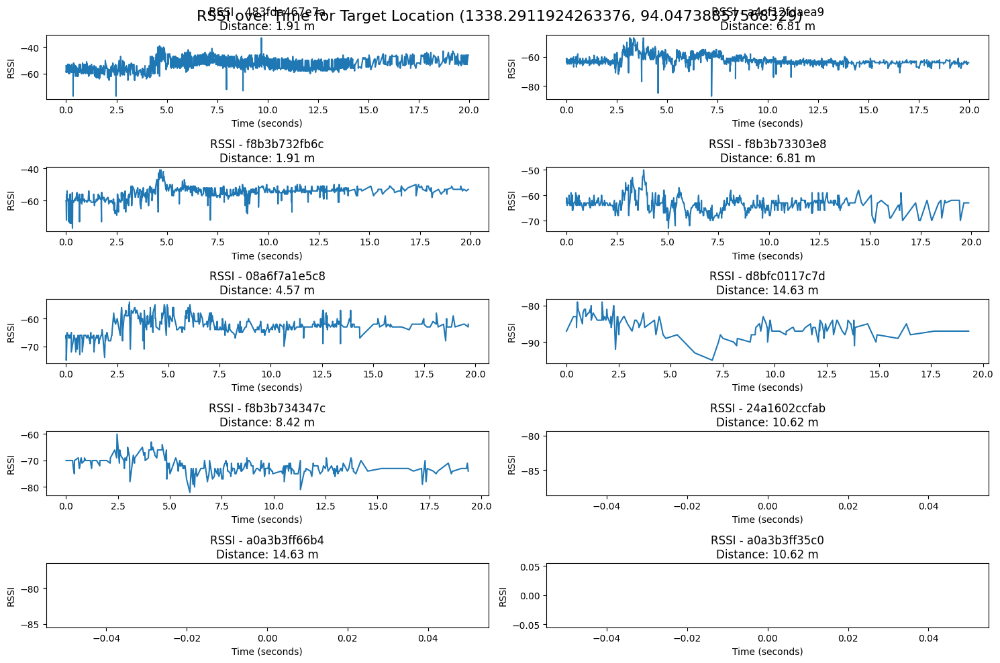

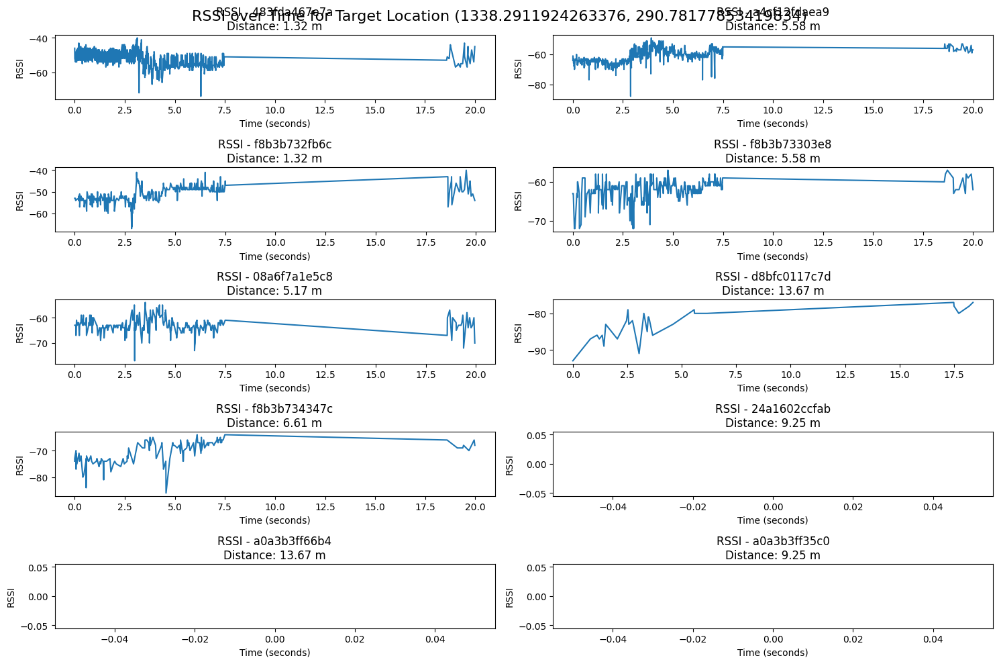

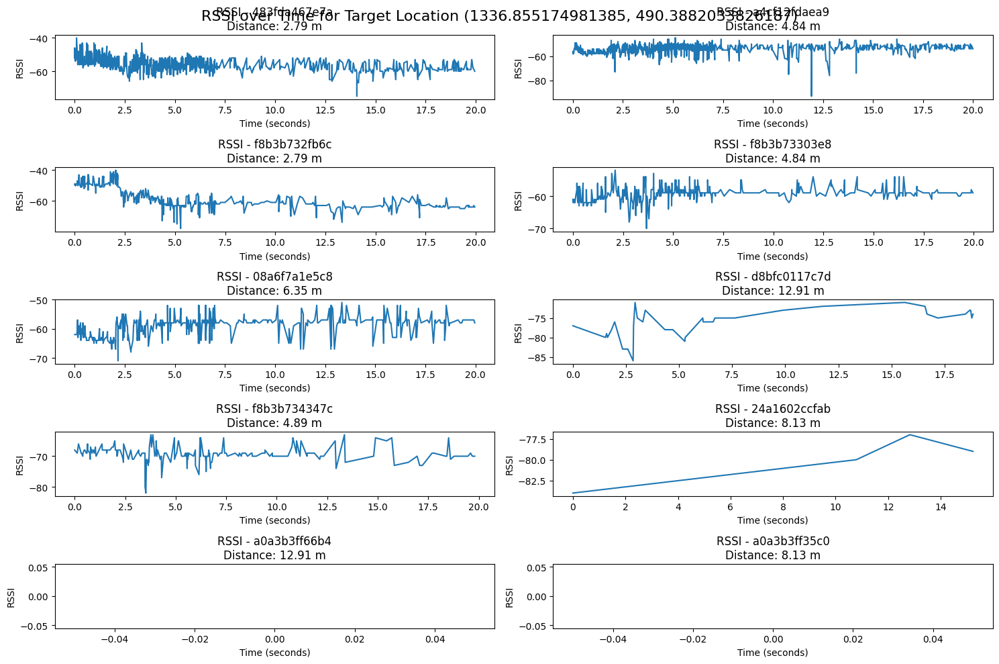

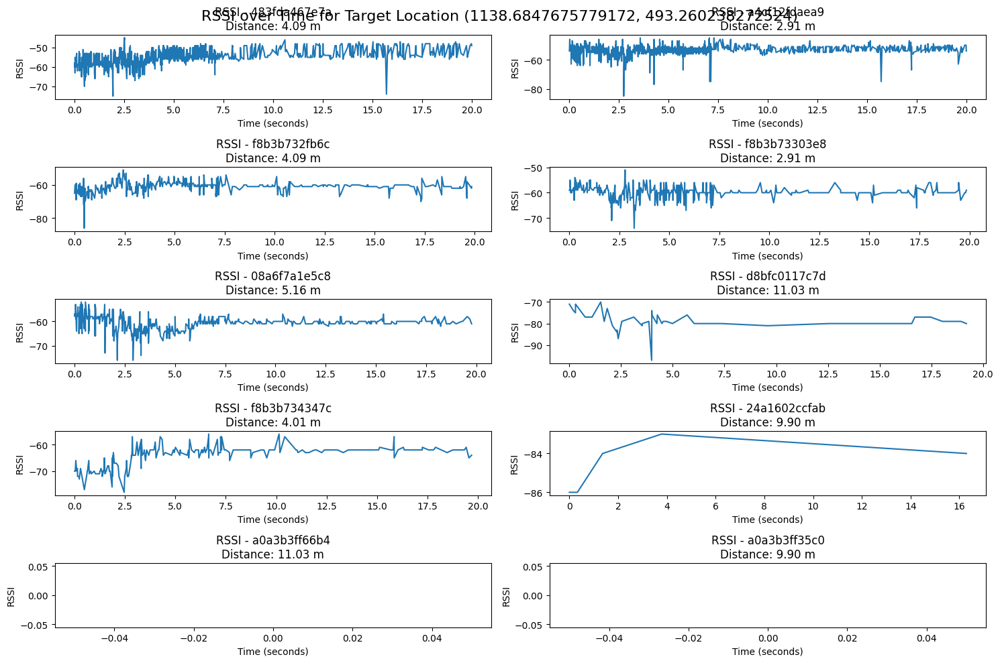

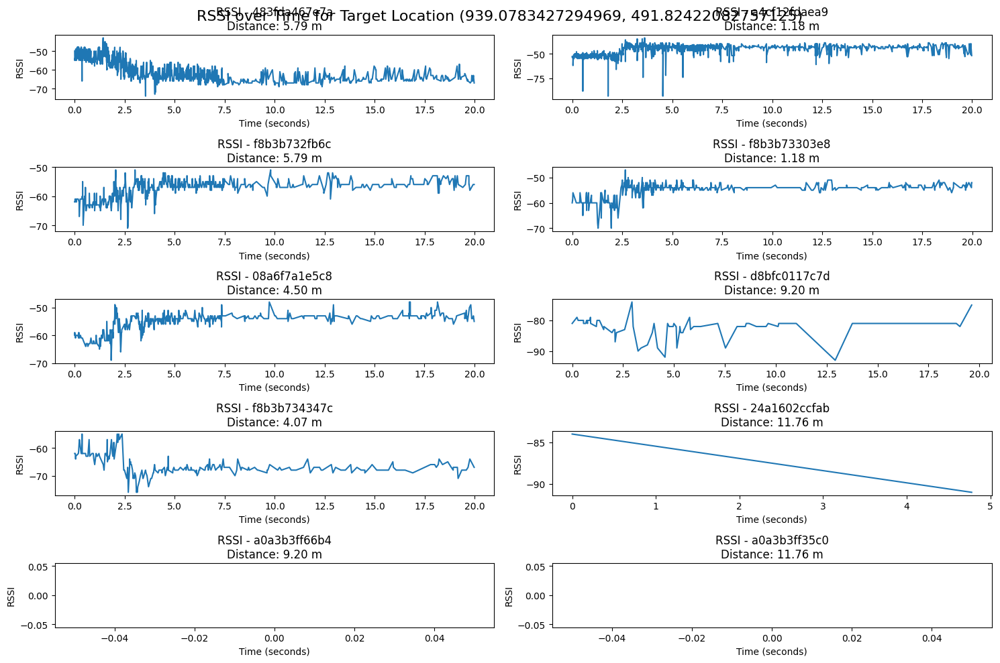

...

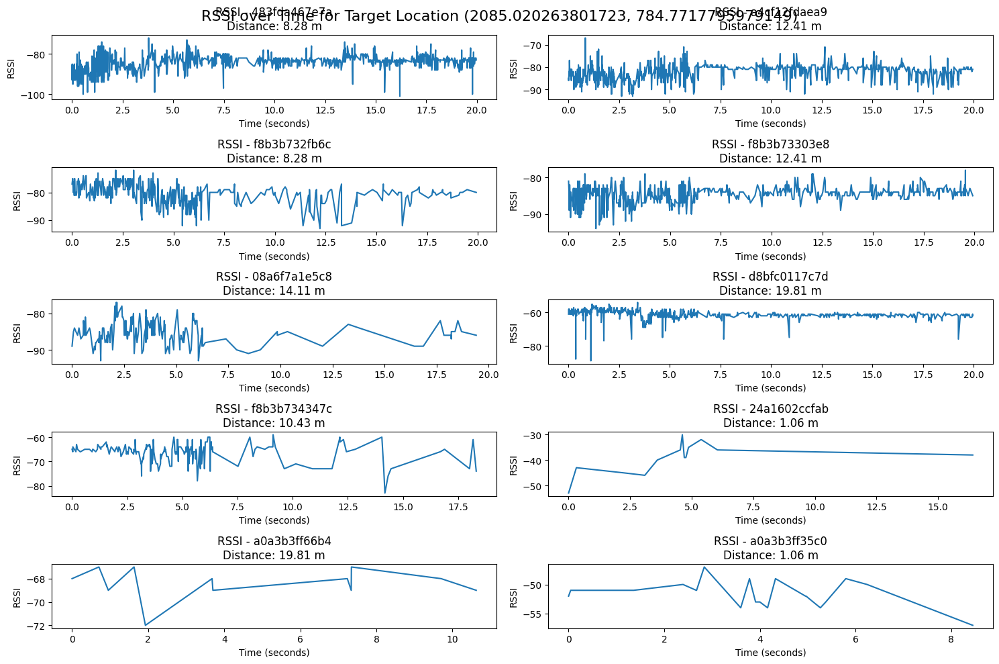

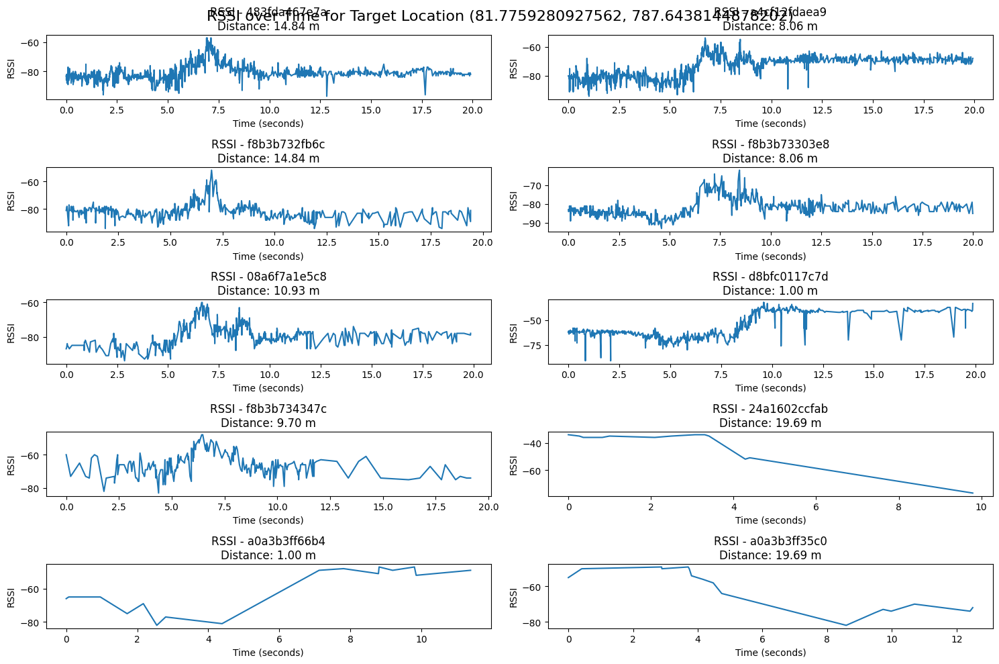

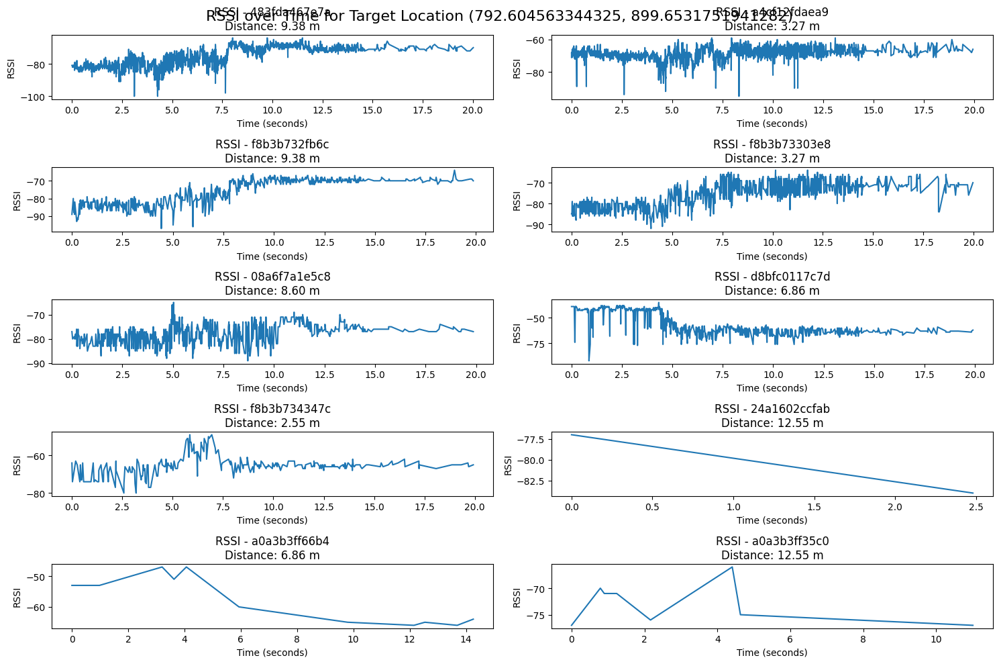

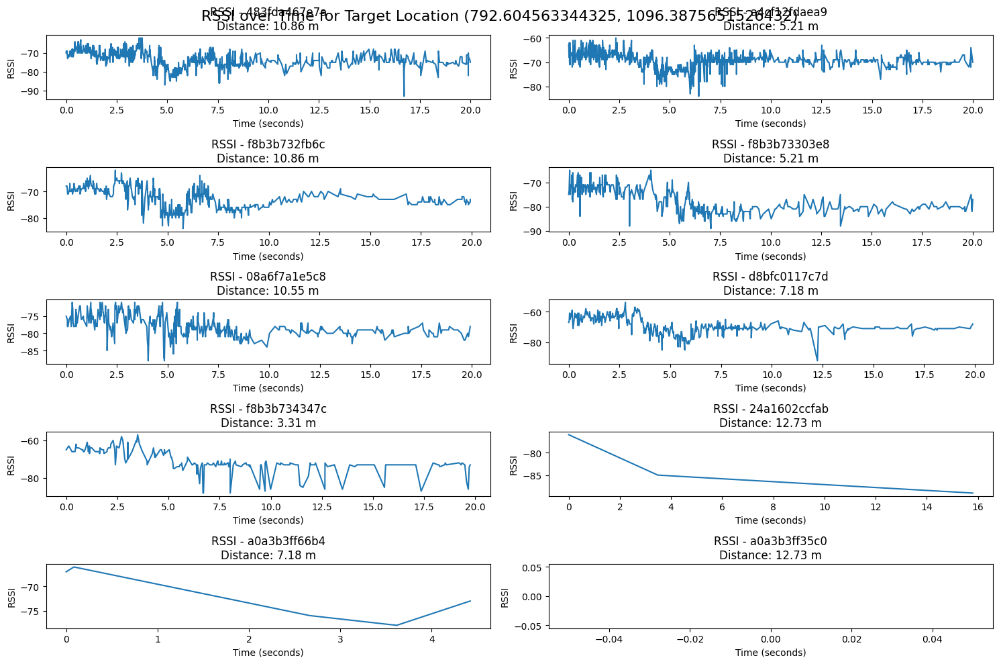

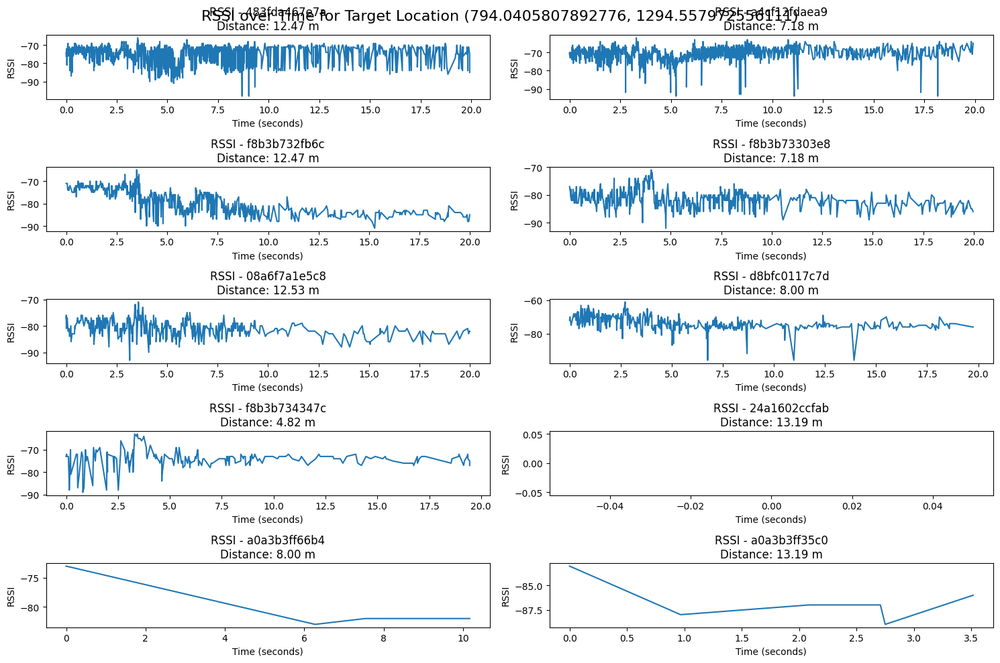

In [113]:
plot_rssi_over_time("./data/filtered/apb/Pixel9.csv")

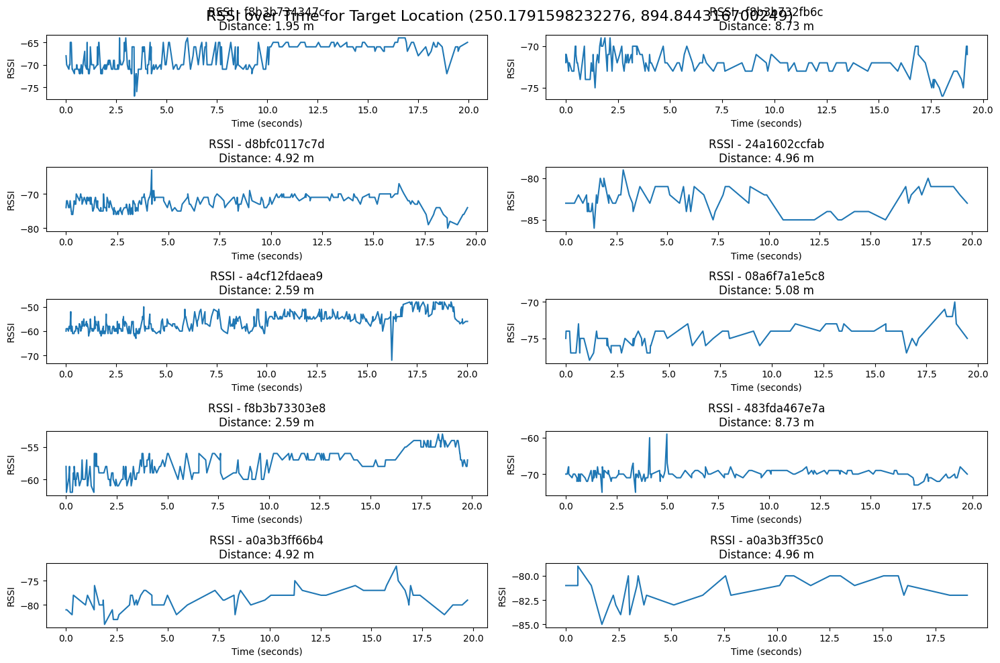

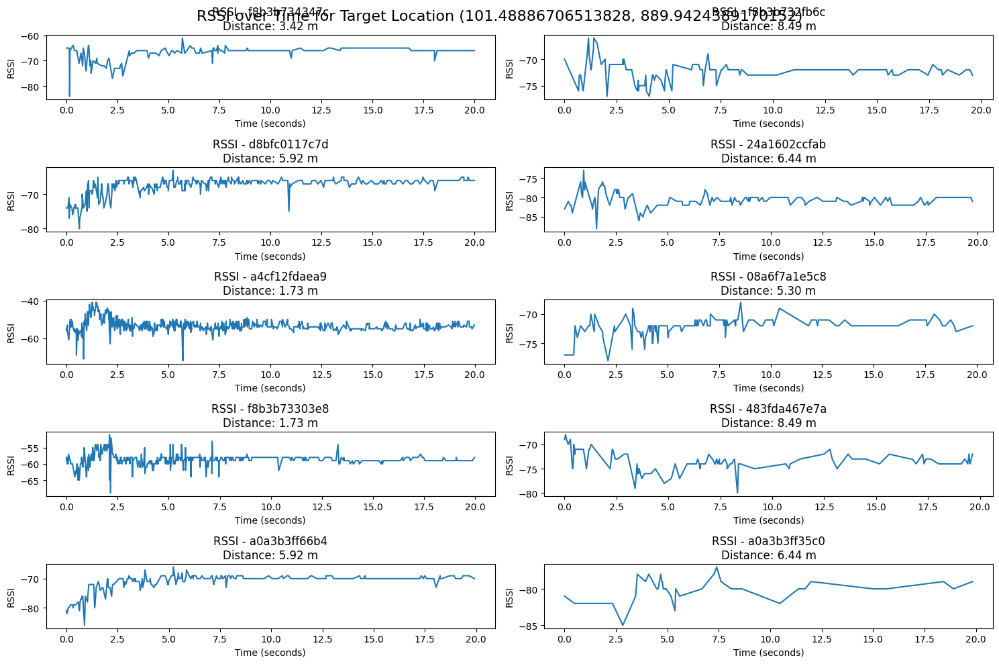

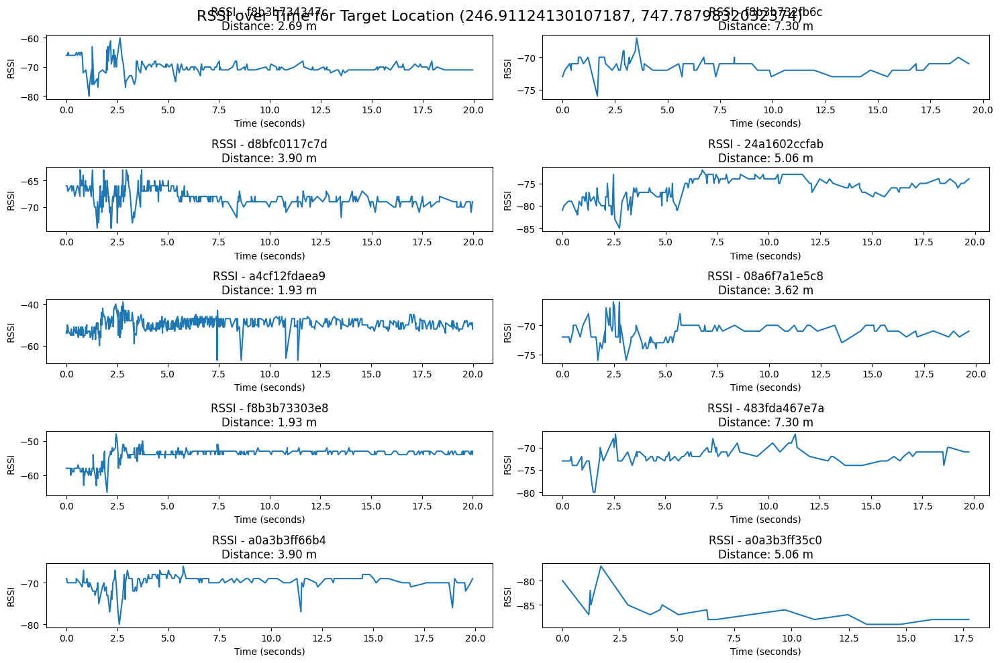

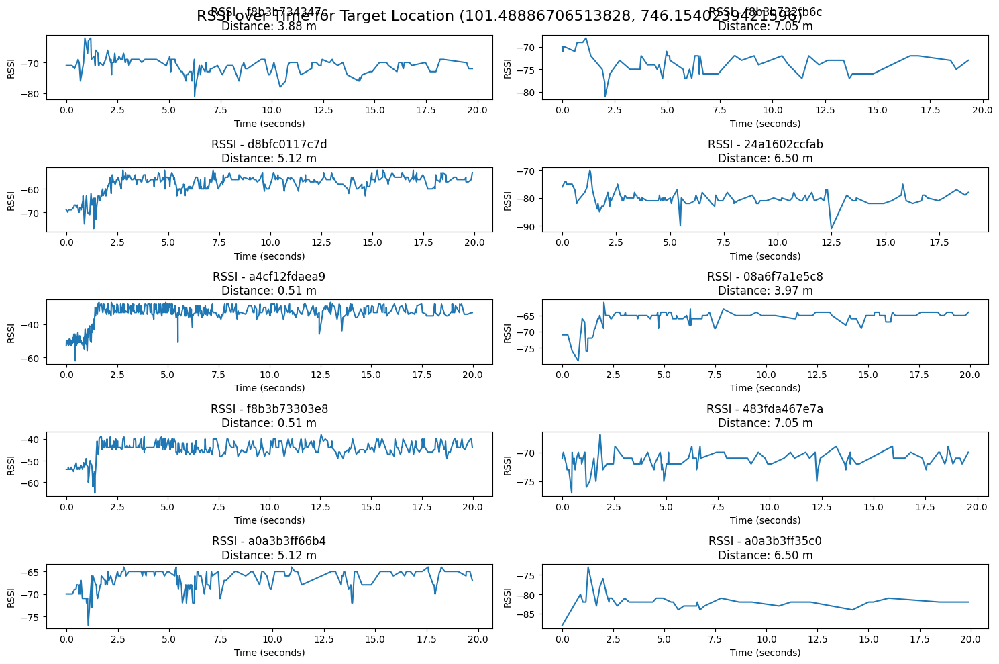

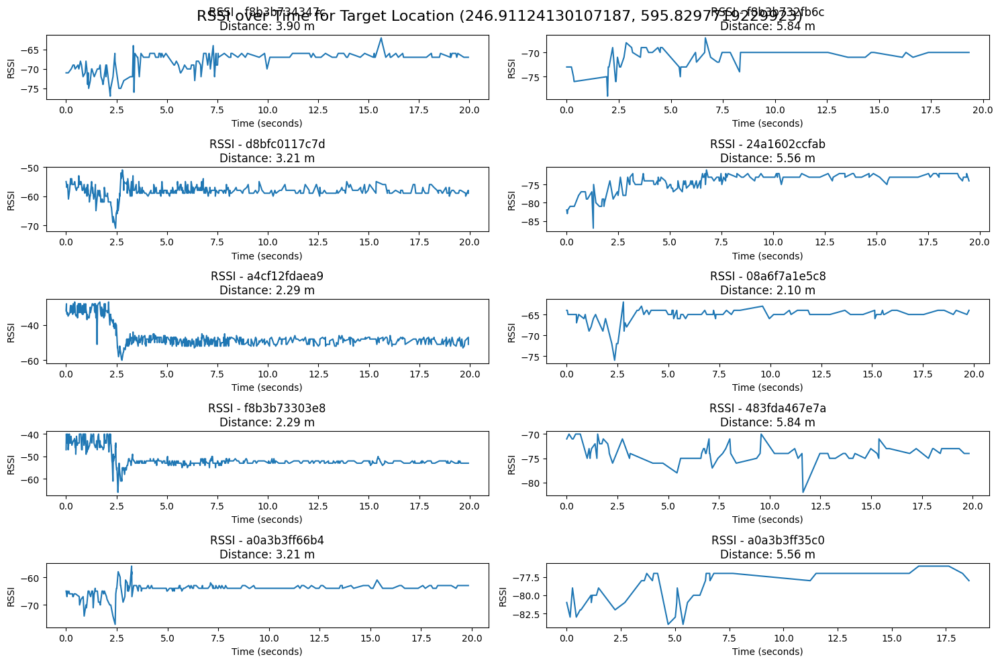

...

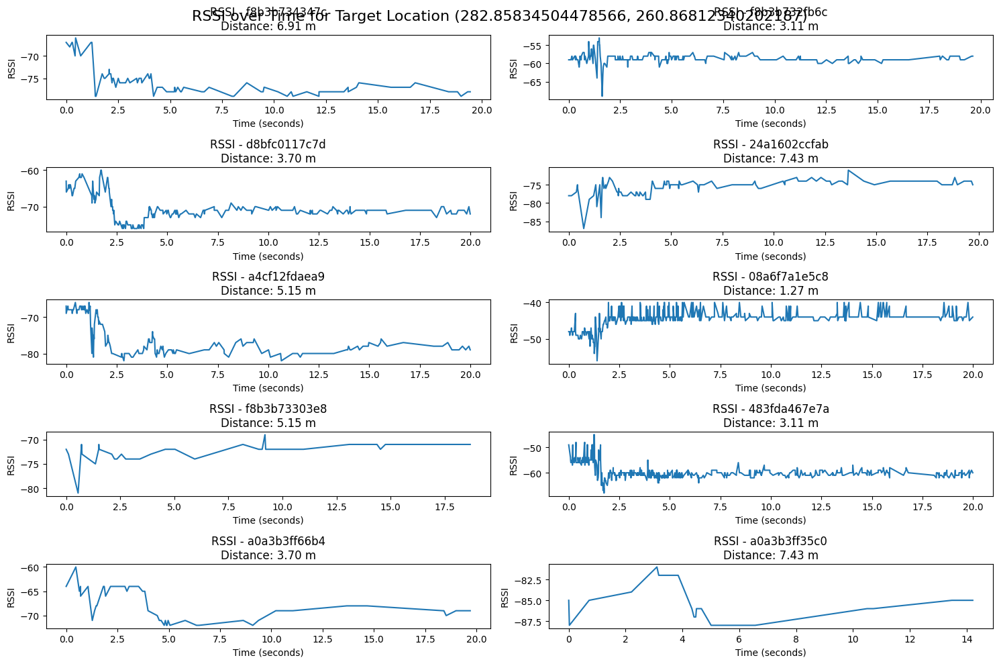

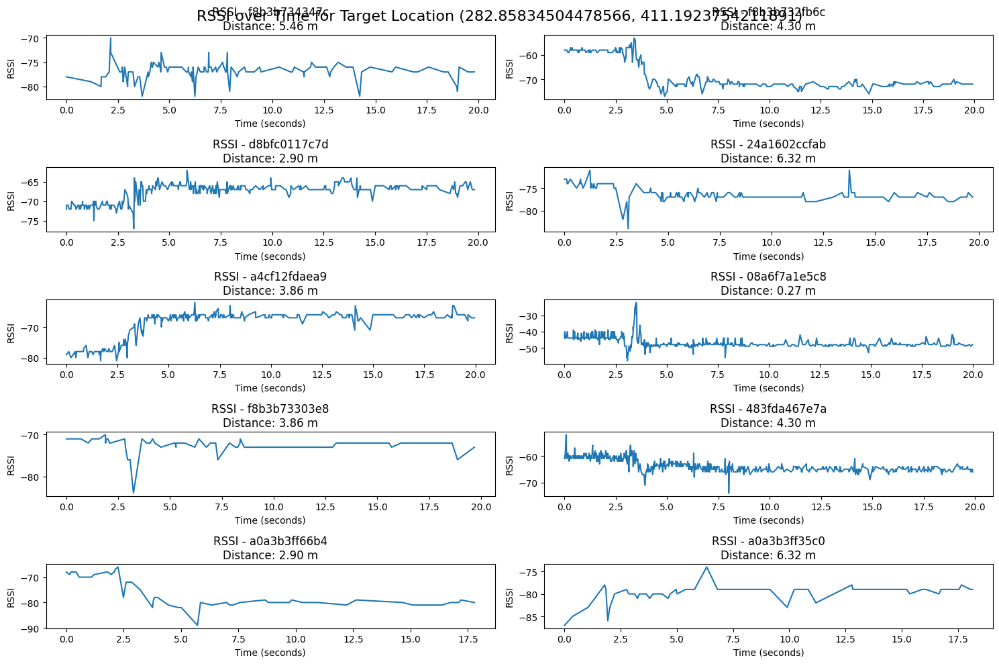

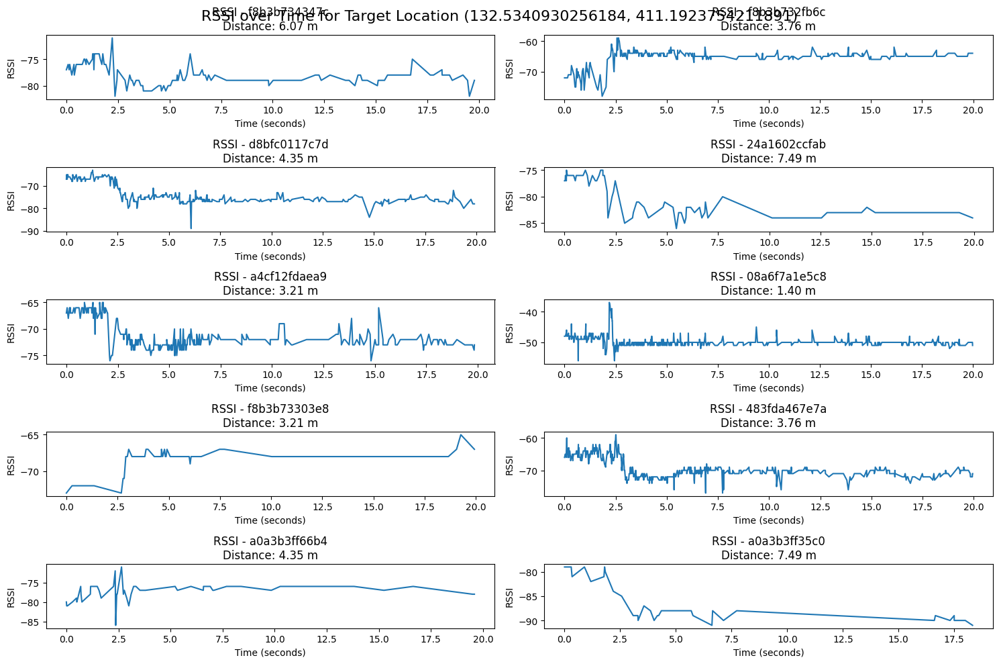

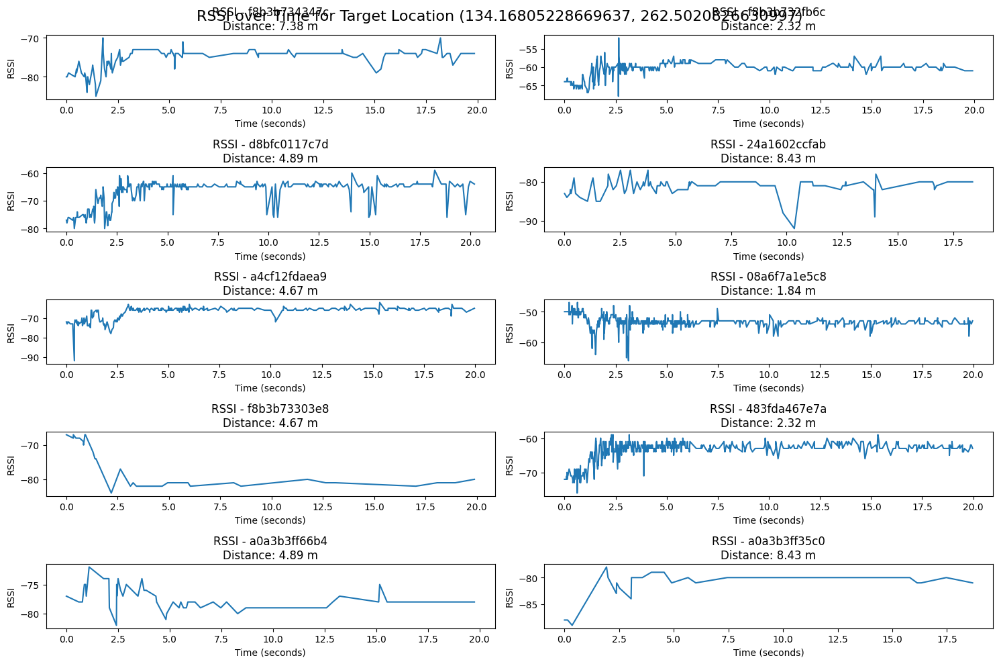

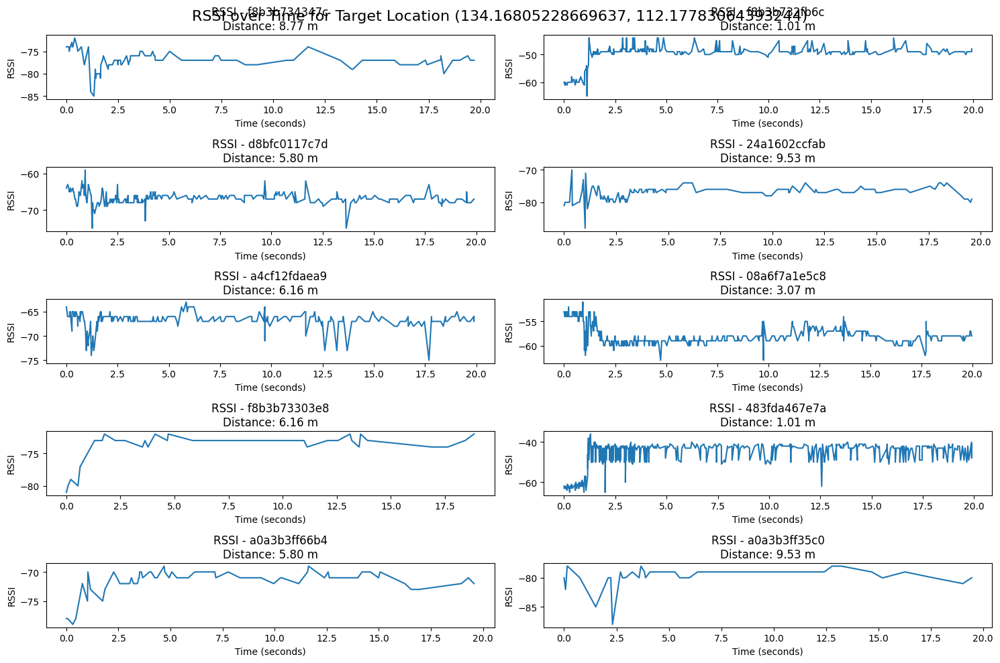

In [114]:
plot_rssi_over_time("./data/filtered/flat/Pixel9.csv")

## Error Metrics

### User Range Error

In [180]:
import numpy as np
import pandas as pd

def rssi_to_distance(rssi, rssi_0=-50, n=2):
    """
    Convert RSSI value to distance using the inverse path loss model.
    
    Parameters:
    - rssi (float): The RSSI value in dBm.
    - rssi_0 (float): RSSI at reference distance (default is -50 dBm at 1 meter).
    - n (float): Path loss exponent (default is 2).
    
    Returns:
    - distance (float): The estimated distance in meters.
    """
    return 10 ** ((rssi_0 - rssi) / (10 * n))

def get_relevant_anchor_stats(anchor_stats, rssis):
        monitor_macs_intersec = anchor_stats.keys() & rssis.keys()
        anchor_stats_intersec = [anchor_stats[monitor_mac] for monitor_mac in monitor_macs_intersec]
        rssis_intersec = [rssis[monitor_mac] for monitor_mac in monitor_macs_intersec]
        
        return monitor_macs_intersec, anchor_stats_intersec, rssis_intersec

def localize(rssis, anchor_positions, path_loss_params):
    relevant_monitor_macs, relevant_positions, relevant_rssis = get_relevant_anchor_stats(anchor_positions, rssis)
    relevant_distances = [rssi_to_distance(rssi, path_loss_params['rssi_0'], path_loss_params['n']) * 100.0 for rssi in relevant_rssis] # m to cm

    print(relevant_distances)

    # Number of known positions
    n = len(relevant_positions)
    
    # Build the A matrix and b vector
    A = []
    b = []
    
    x_n, y_n = relevant_positions[n-1]
    d_n = relevant_distances[n-1]
    for i in range(n - 1):
        x_i, y_i = relevant_positions[i]
        d_i = relevant_distances[i]
        A.append([2*(x_i - x_n), 2*(y_i - y_n)])
        b.append(x_i**2 + y_i**2 - x_n**2 - y_n**2 - d_i**2 + d_n**2)
    A = np.array(A)
    b = np.array(b)

    # Compute the least squares solution using the normal equation: x = (A^T A)^(-1) A^T b
    position, residuals, rank, s = np.linalg.lstsq(A, b, rcond=None)
    
    return {
        'position': position,
        'distances': {monitor_mac: distance for monitor_mac, distance in zip(relevant_monitor_macs, relevant_distances)}
    }

def estimate_positions(csv_file, monitor_mac_col, target_mac_col, timestamp_col, rssi_col, target_position_x_col, target_position_y_col, anchor_position_x_col, anchor_position_y_col, path_loss_params=None):
    """
    Estimate the positions of the target devices based on RSSI values and multilateration.
    
    Parameters:
    - csv_file (str): Path to the CSV file.
    - monitor_mac_col (str): Column name for monitor MAC addresses.
    - target_mac_col (str): Column name for target MAC addresses.
    - timestamp_col (str): Column name for timestamp.
    - rssi_col (str): Column name for RSSI values.
    - target_position_x_col (str): Column name for target position X.
    - target_position_y_col (str): Column name for target position Y.
    - anchor_position_x_col (str): Column name for anchor position X.
    - anchor_position_y_col (str): Column name for anchor position Y.
    - path_loss_params (dict): Dictionary with the path loss model parameters ('rssi_0', 'n').
    
    Returns:
    - position_errors (list of float): List of errors (distances between estimated and ground truth positions).
    """
    df = pd.read_csv(csv_file)
    
    anchor_positions = df[[monitor_mac_col, anchor_position_x_col, anchor_position_y_col]].drop_duplicates().set_index(monitor_mac_col).apply(
        lambda row: (row[anchor_position_x_col], row[anchor_position_y_col]), axis=1
    ).to_dict()

    # Default path loss parameters
    if path_loss_params is None:
        path_loss_params = {'rssi_0': -50, 'n': 2}
    
    position_errors = []
    
    for target_mac, target_position_x, target_position_y in df[[target_mac_col, target_position_x_col, target_position_y_col]].drop_duplicates().values:
        # Filter the data for the current target
        target_data = df[(df[target_mac_col] == target_mac) & 
                         (df[target_position_x_col] == target_position_x) &
                         (df[target_position_y_col] == target_position_y)]

        # Get the median RSSI per monitor node
        median_rssi_dict = target_data.groupby(monitor_mac_col)[rssi_col].median().to_dict()
        
        # Perform multilateration
        localization_result = localize(median_rssi_dict, anchor_positions, path_loss_params)
        estimated_position = localization_result['position']

        print(estimated_position)
        print((target_position_x, target_position_y))

        error = np.sqrt((estimated_position[0] - target_position_x)**2 + (estimated_position[1] - target_position_y)**2)
        position_errors.append(error)
    
    return position_errors


In [181]:
csv_file = "./data/filtered/apb/Pixel9.csv"  # Path to your CSV file
monitor_mac_column = "monitor_mac"
target_mac_column = "target_mac"
timestamp_column = "timestamp"
rssi_column = "rssi"
target_position_x_column = "target_position_x"
target_position_y_column = "target_position_y"
anchor_position_x_column = "anchor_position_x"
anchor_position_y_column = "anchor_position_y"

# Call the function to estimate positions and calculate errors
errors = np.array(estimate_positions(csv_file, monitor_mac_column, target_mac_column, timestamp_column, rssi_column, 
                            target_position_x_column, target_position_y_column, anchor_position_x_column, 
                            anchor_position_y_column)) / 100.0 # convert to meters

# Print the position errors for each target location
print("Position errors (in meters):")
print(errors)

[158.48931924611136, 158.48931924611136, 446.6835921509632, 5011.872336272722, 1412.537544622754, 5623.413251903491, 3548.133892335755, 446.6835921509632, 446.6835921509632]
[ 1808.13690793 -7767.25034469]
(1338.2911924263376, 94.04738857568329)
[100.0, 141.25375446227542, 354.8133892335755, 891.2509381337454, 4466.83592150963, 354.8133892335755, 446.6835921509632]
[ 5978.18365552 -2765.617003  ]
(1338.2911924263376, 290.78177853419834)
[316.22776601683796, 223.87211385683395, 281.83829312644536, 2985.3826189179604, 891.2509381337454, 1883.6490894898002, 158.48931924611136, 251.188643150958]
[   58.68696525 -1036.3072494 ]
(1336.855174981385, 490.3882033826187)
[354.8133892335755, 177.82794100389228, 316.22776601683796, 5011.872336272722, 421.6965034285822, 2818.3829312644534, 158.48931924611136, 354.8133892335755]
[-2203.5266054  -3486.50246419]
(1138.6847675779172, 493.260238272524)
[223.87211385683395, 446.6835921509632, 158.48931924611136, 7498.942093324558, 707.9457843841378, 3981

In [187]:
from scipy.optimize import minimize

# Objective function for optimization (RMSE minimization)
def objective_function(params, csv_file, monitor_mac_col, target_mac_col, timestamp_col, rssi_col, 
                       target_position_x_col, target_position_y_col, anchor_position_x_col, anchor_position_y_col):
    """
    Objective function to minimize RMSE by adjusting the path loss model parameters.
    
    Parameters:
    - params (list): Path loss model parameters [rssi_0, n].
    - csv_file (str): Path to the CSV file.
    - monitor_mac_col (str): Column name for monitor MAC addresses.
    - target_mac_col (str): Column name for target MAC addresses.
    - timestamp_col (str): Column name for timestamp.
    - rssi_col (str): Column name for RSSI values.
    - target_position_x_col (str): Column name for target position X.
    - target_position_y_col (str): Column name for target position Y.
    - anchor_position_x_col (str): Column name for anchor position X.
    - anchor_position_y_col (str): Column name for anchor position Y.
    
    Returns:
    - rmse (float): Root mean square error for the estimated positions.
    """
    rssi_0, n = params  # Unpack parameters
    path_loss_params = {'rssi_0': rssi_0, 'n': n}
    position_errors = estimate_positions(csv_file, monitor_mac_col, target_mac_col, timestamp_col, rssi_col, 
                                         target_position_x_col, target_position_y_col, anchor_position_x_col, 
                                         anchor_position_y_col, path_loss_params)

    print(position_errors)

    rmse = np.sqrt(np.mean(np.array(position_errors)**2))
    return rmse

# Optimizing the path loss model parameters with bounds
def optimize_path_loss_params(csv_file, monitor_mac_col, target_mac_col, timestamp_col, rssi_col, 
                              target_position_x_col, target_position_y_col, anchor_position_x_col, 
                              anchor_position_y_col):
    """
    Optimize the path loss model parameters (rssi_0 and n) using RMSE minimization with bounds.
    
    Parameters:
    - csv_file (str): Path to the CSV file.
    - monitor_mac_col (str): Column name for monitor MAC addresses.
    - target_mac_col (str): Column name for target MAC addresses.
    - timestamp_col (str): Column name for timestamp.
    - rssi_col (str): Column name for RSSI values.
    - target_position_x_col (str): Column name for target position X.
    - target_position_y_col (str): Column name for target position Y.
    - anchor_position_x_col (str): Column name for anchor position X.
    - anchor_position_y_col (str): Column name for anchor position Y.
    
    Returns:
    - result (dict): Dictionary with optimized parameters and minimized RMSE.
    """
    # Set bounds for the parameters: rssi_0 between -80 dBm and -30 dBm, n between 1.5 and 4
    bounds = [(-80, -10), (1.5, 6)]
    
    initial_guess = [-50, 2]  # Initial guess for rssi_0 and n
    result = minimize(objective_function, initial_guess, args=(csv_file, monitor_mac_col, target_mac_col, 
                                                               timestamp_col, rssi_col, target_position_x_col, 
                                                               target_position_y_col, anchor_position_x_col, 
                                                               anchor_position_y_col), method='Nelder-Mead', bounds=bounds)
    
    optimized_rssi_0, optimized_n = result.x
    minimized_rmse = result.fun
    
    return {
        'optimized_rssi_0': optimized_rssi_0,
        'optimized_n': optimized_n,
        'minimized_rmse': minimized_rmse
    }

In [188]:
optimize_path_loss_params(csv_file, monitor_mac_column, target_mac_column, timestamp_column, rssi_column, 
                            target_position_x_column, target_position_y_column, anchor_position_x_column, 
                            anchor_position_y_column)

[158.48931924611136, 158.48931924611136, 446.6835921509632, 5011.872336272722, 1412.537544622754, 5623.413251903491, 3548.133892335755, 446.6835921509632, 446.6835921509632]
[ 1808.13690793 -7767.25034469]
(1338.2911924263376, 94.04738857568329)
[100.0, 141.25375446227542, 354.8133892335755, 891.2509381337454, 4466.83592150963, 354.8133892335755, 446.6835921509632]
[ 5978.18365552 -2765.617003  ]
(1338.2911924263376, 290.78177853419834)
[316.22776601683796, 223.87211385683395, 281.83829312644536, 2985.3826189179604, 891.2509381337454, 1883.6490894898002, 158.48931924611136, 251.188643150958]
[   58.68696525 -1036.3072494 ]
(1336.855174981385, 490.3882033826187)
[354.8133892335755, 177.82794100389228, 316.22776601683796, 5011.872336272722, 421.6965034285822, 2818.3829312644534, 158.48931924611136, 354.8133892335755]
[-2203.5266054  -3486.50246419]
(1138.6847675779172, 493.260238272524)
[223.87211385683395, 446.6835921509632, 158.48931924611136, 7498.942093324558, 707.9457843841378, 3981

{'optimized_rssi_0': -26.703493725441394,
 'optimized_n': 6.0,
 'minimized_rmse': 500.4968230572758}

In [183]:
objective_function([-50, 2], csv_file, monitor_mac_column, target_mac_column, 
                                                               timestamp_column, rssi_column, target_position_x_column, 
                                                               target_position_y_column, anchor_position_x_column, 
                                                               anchor_position_y_column)

[158.48931924611136, 158.48931924611136, 446.6835921509632, 5011.872336272722, 1412.537544622754, 5623.413251903491, 3548.133892335755, 446.6835921509632, 446.6835921509632]
[ 1808.13690793 -7767.25034469]
(1338.2911924263376, 94.04738857568329)
[100.0, 141.25375446227542, 354.8133892335755, 891.2509381337454, 4466.83592150963, 354.8133892335755, 446.6835921509632]
[ 5978.18365552 -2765.617003  ]
(1338.2911924263376, 290.78177853419834)
[316.22776601683796, 223.87211385683395, 281.83829312644536, 2985.3826189179604, 891.2509381337454, 1883.6490894898002, 158.48931924611136, 251.188643150958]
[   58.68696525 -1036.3072494 ]
(1336.855174981385, 490.3882033826187)
[354.8133892335755, 177.82794100389228, 316.22776601683796, 5011.872336272722, 421.6965034285822, 2818.3829312644534, 158.48931924611136, 354.8133892335755]
[-2203.5266054  -3486.50246419]
(1138.6847675779172, 493.260238272524)
[223.87211385683395, 446.6835921509632, 158.48931924611136, 7498.942093324558, 707.9457843841378, 3981

9693.799973308485

In [1]:
from abc import ABC, abstractmethod
import numpy as np
import pandas as pd
from scipy.interpolate import Rbf

def inverse_path_loss_model(rssi, rssi_0, n):
    distance = pow(10, ((rssi_0 - rssi) / (10.0 * n)))
    return distance

class AbstractLocalization(ABC):

    def __init__(self):
        pass

    @abstractmethod
    def localize(self, rssis):
        pass
    
    def get_relevant_anchor_stats(self, anchor_stats, rssis):
        monitor_macs_intersec = anchor_stats.keys() & rssis.keys()
        anchor_stats_intersec = [anchor_stats[monitor_mac] for monitor_mac in monitor_macs_intersec]
        rssis_intersec = [rssis[monitor_mac] for monitor_mac in monitor_macs_intersec]
        
        return monitor_macs_intersec, anchor_stats_intersec, rssis_intersec

class TrilaterationLeastSquaresLocalization(AbstractLocalization):
    def __init__(self, anchor_positions, monitor_model_params):
        super().__init__()
        
        self.anchor_positions = anchor_positions
        self.monitor_model_params = monitor_model_params
    
    def localize(self, rssis):
        relevant_monitor_macs, relevant_positions, relevant_rssis = self.get_relevant_anchor_stats(self.anchor_positions, rssis)
        relevant_distances = [inverse_path_loss_model(rssi, self.monitor_model_params[monitor_mac][0], self.monitor_model_params[monitor_mac][1]) * 100.0 for rssi, monitor_mac in zip(relevant_rssis, relevant_monitor_macs)] # m to cm

        print("rssis:")
        print(relevant_rssis)
        print("distances:")
        print(relevant_distances)
        
        # Number of known positions
        n = len(relevant_positions)
        
        # Build the A matrix and b vector
        A = []
        b = []
        
        x_n, y_n = relevant_positions[n-1]
        d_n = relevant_distances[n-1]
        for i in range(n - 1):
            x_i, y_i = relevant_positions[i]
            d_i = relevant_distances[i]
            A.append([2*(x_i - x_n), 2*(y_i - y_n)])
            b.append(x_i**2 + y_i**2 - x_n**2 - y_n**2 - d_i**2 + d_n**2)
        A = np.array(A)
        b = np.array(b)

        # Compute the least squares solution using the normal equation: x = (A^T A)^(-1) A^T b
        position, residuals, rank, s = np.linalg.lstsq(A, b, rcond=None)
        
        return {
            'position': position,
            'distances': {monitor_mac: distance for monitor_mac, distance in zip(relevant_monitor_macs, relevant_distances)}
        }

class TrilaterationWeightedCentroidLocalization(AbstractLocalization):
    def __init__(self, anchor_positions, rssi_0, n):
        super().__init__()
        
        self.anchor_positions = anchor_positions
        self.rssi_0 = rssi_0
        self.n = n
    
    def localize(self, rssis):
        relevant_monitor_macs, relevant_positions, relevant_rssis = self.get_relevant_anchor_stats(self.anchor_positions, rssis)
        relevant_distances = [inverse_path_loss_model(rssi, self.rssi_0, self.n) * 100.0 for rssi in relevant_rssis] # m to cm
        
        relevant_positions_np = np.array(relevant_positions)
        distances_np = np.array(relevant_distances)
        
        # Calculate the weights as the inverse of the distances
        weights = 1.0 / distances_np
        
        # Normalize the weights so they sum up to 1
        weights /= np.sum(weights)
        
        # Weighted sum of positions
        x = np.sum([w * pos[0] for w, pos in zip(weights, relevant_positions_np)])
        y = np.sum([w * pos[1] for w, pos in zip(weights, relevant_positions_np)])
        
        position = (x, y)
        
        return {
            'position': position,
            'distances': {monitor_mac: distance for monitor_mac, distance in zip(relevant_monitor_macs, relevant_distances)}
        }

class FingerprintingLocalization(AbstractLocalization):
    def __init__(self, fingerprints_file_path, background_size, heatmap_resolution=5.0): # every 5cm
        super().__init__()
        
        x = np.arange(0, background_size[0], heatmap_resolution)
        y = np.arange(0, background_size[1], heatmap_resolution)
        self.pos_lookup_x = np.append(x, background_size[0]) # include boundary
        self.pos_lookup_y = np.append(y, background_size[1])
        num_x = len(self.pos_lookup_x)
        num_y = len(self.pos_lookup_y)
            
        gx, gy = np.meshgrid(self.pos_lookup_x, self.pos_lookup_y)
        gx, gy = gx.flatten(), gy.flatten()
        
        
        df = pd.read_csv(fingerprints_file_path, index_col=False)
        df_mean = df.groupby(['monitor_mac', 'target_position_x', 'target_position_y', 'anchor_position_x', 'anchor_position_y'], as_index=False).agg({'rssi':['median']})
        df_mean.columns = ['monitor_mac', 'target_position_x', 'target_position_y', 'anchor_position_x', 'anchor_position_y', 'rssi_median']
        
        def generate_interpolated_fingerprint_map(monitor_mac):
            monitor_rows = df_mean[df_mean['monitor_mac'] == monitor_mac]
            
            target_positions_x = monitor_rows['target_position_x'].to_list()
            target_positions_y = monitor_rows['target_position_y'].to_list()
            rssi_medians = monitor_rows['rssi_median'].to_list()
            
            
            # from https://github.com/jantman/python-wifi-survey-heatmap/blob/master/wifi_survey_heatmap/heatmap.py
            
            rbf = Rbf(target_positions_x, target_positions_y, rssi_medians, function='linear')
            z = rbf(gx, gy)
            z = z.reshape((num_y, num_x))
            
            return z
        
        monitor_macs = df_mean['monitor_mac'].unique()
        self.interpolated_fingerprints = {monitor_mac: generate_interpolated_fingerprint_map(monitor_mac) for monitor_mac in monitor_macs}
    
    def localize(self, rssis):
        _, relevant_interpolated_fingerprints, relevant_rssis = self.get_relevant_anchor_stats(self.interpolated_fingerprints, rssis)
        
        diff = np.moveaxis(relevant_interpolated_fingerprints, 0, -1) - relevant_rssis        
        norm = np.linalg.norm(diff, axis=2)
        min_pos_heatmap = np.unravel_index(np.argmin(norm, axis=None), norm.shape)        
        min_pos = (self.pos_lookup_x[min_pos_heatmap[1]], self.pos_lookup_y[min_pos_heatmap[0]])
        
        position = min_pos
        
        return {
            'position': position,
            'heatmap': norm
        }

In [2]:
def estimate_positions(df, monitor_model_params):    
    anchor_positions = df[["monitor_mac", "anchor_position_x", "anchor_position_y"]].drop_duplicates().set_index("monitor_mac").apply(
        lambda row: (row["anchor_position_x"], row["anchor_position_y"]), axis=1
    ).to_dict()

    tri_alg = TrilaterationLeastSquaresLocalization(anchor_positions, monitor_model_params)
    
    position_errors = []
    
    for target_mac, target_position_x, target_position_y in df[["target_mac", "target_position_x", "target_position_y"]].drop_duplicates().values:
        # Filter the data for the current target
        target_data = df[(df["target_mac"] == target_mac) & 
                         (df["target_position_x"] == target_position_x) &
                         (df["target_position_y"] == target_position_y)]

        # Get the median RSSI per monitor node
        median_rssi_dict = target_data.groupby("monitor_mac")["rssi"].median().to_dict()
        
        # Perform multilateration
        localization_result = tri_alg.localize(median_rssi_dict)
        estimated_position = localization_result['position']

        print(estimated_position)
        print((target_position_x, target_position_y))

        error = np.sqrt((estimated_position[0] - target_position_x)**2 + (estimated_position[1] - target_position_y)**2)
        position_errors.append(error)
    
    return position_errors


In [3]:
from scipy.optimize import minimize

# Objective function for optimization (RMSE minimization)
def objective_function(params, df):
    monitor_macs = df["monitor_mac"].unique()

    monitor_model_params = {}
    if len(params) >= 2 * len(monitor_macs):
        for idx, monitor_mac in enumerate(monitor_macs):
            monitor_model_params[monitor_mac] = (params[idx * 2], params[idx * 2 + 1])
    else:
        monitor_model_params = {monitor_mac: (params[0], params[1]) for monitor_mac in monitor_macs}

    position_errors = estimate_positions(df, monitor_model_params)

    print(position_errors)

    rmse = np.sqrt(np.mean(np.array(position_errors)**2))
    return rmse

# Optimizing the path loss model parameters with bounds
def optimize_path_loss_params(df):
    # Set bounds for the parameters: rssi_0 between -80 dBm and -30 dBm, n between 1.5 and 4
    bounds = [(-80, -10), (1.5, 6)]
    
    initial_guess = [-50, 2]  # Initial guess for rssi_0 and n
    result = minimize(objective_function, initial_guess, args=(df), method='Nelder-Mead', bounds=bounds)
    
    optimized_rssi_0, optimized_n = result.x
    minimized_rmse = result.fun
    
    return {
        'optimized_rssi_0': optimized_rssi_0,
        'optimized_n': optimized_n,
        'minimized_rmse': minimized_rmse
    }

# Optimizing the path loss model parameters with bounds of multiple monitors
def optimize_path_loss_params_multiple(df):
    initial_guess = []
    bounds = []
    for _ in df["monitor_mac"].unique():
        # Initial guess for rssi_0 and n
        initial_guess.append(-50)
        initial_guess.append(2)

        bounds.append((-80, -10))
        bounds.append((1.5, 6))

    result = minimize(objective_function, initial_guess, args=(df), method='Nelder-Mead', bounds=bounds)
    
    optimized_rssi_0, optimized_n = result.x
    minimized_rmse = result.fun
    
    return {
        'optimized_rssi_0': optimized_rssi_0,
        'optimized_n': optimized_n,
        'minimized_rmse': minimized_rmse
    }

In [4]:
df = pd.read_csv("./data/filtered/apb/Pixel9.csv")
monitor_model_params = {monitor_mac: (-50, 2) for monitor_mac in df["monitor_mac"].unique()}
estimate_positions(df, monitor_model_params)

rssis:
[-81.0, -63.0, -73.0, -63.0, -85.0, -63.0, -54.0, -84.0, -54.0]
distances:
[3548.133892335755, 446.6835921509632, 1412.537544622754, 446.6835921509632, 5623.413251903491, 446.6835921509632, 158.48931924611136, 5011.872336272722, 158.48931924611136]
[  1099.79422646 -11015.15533572]
(1338.2911924263376, 94.04738857568329)
rssis:
[-61.0, -69.0, -83.0, -63.0, -61.0, -53.0, -50.0]
distances:
[354.8133892335755, 891.2509381337454, 4466.83592150963, 446.6835921509632, 354.8133892335755, 141.25375446227542, 100.0]
[5139.62424297 -112.43836981]
(1338.2911924263376, 290.78177853419834)
rssis:
[-54.0, -69.0, -75.5, -58.0, -59.0, -57.0, -79.5, -60.0]
distances:
[158.48931924611136, 891.2509381337454, 1883.6490894898002, 251.188643150958, 281.83829312644536, 223.87211385683395, 2985.3826189179604, 316.22776601683796]
[  -25.80097984 -2701.8023828 ]
(1336.855174981385, 490.3882033826187)
rssis:
[-54.0, -62.5, -79.0, -61.0, -60.0, -55.0, -84.0, -61.0]
distances:
[158.48931924611136, 421.69650

[11111.76250521261,
 3822.658688550462,
 3470.866251356168,
 9773.270745402726,
 22332.762410671596,
 3619.6333039469464,
 49803.50524843631,
 13379.179496768402,
 7720.466028496003,
 4703.534232553672,
 12075.910064636551,
 4182.884645550717,
 2860.762146066382,
 2094.7922877502524,
 553.4498426897692,
 1405.3800197357345,
 4510.52199537295,
 6711.486389895122,
 8367.15393292984,
 11149.322757491045,
 1629.9962308372305,
 11216.873401087218,
 15120.988976017112]

In [5]:
df = pd.read_csv("./data/filtered/apb/Pixel9.csv")
optimize_path_loss_params(df)

rssis:
[-81.0, -63.0, -73.0, -63.0, -85.0, -63.0, -54.0, -84.0, -54.0]
distances:
[3548.133892335755, 446.6835921509632, 1412.537544622754, 446.6835921509632, 5623.413251903491, 446.6835921509632, 158.48931924611136, 5011.872336272722, 158.48931924611136]
[  1099.79422646 -11015.15533572]
(1338.2911924263376, 94.04738857568329)
rssis:
[-61.0, -69.0, -83.0, -63.0, -61.0, -53.0, -50.0]
distances:
[354.8133892335755, 891.2509381337454, 4466.83592150963, 446.6835921509632, 354.8133892335755, 141.25375446227542, 100.0]
[5139.62424297 -112.43836981]
(1338.2911924263376, 290.78177853419834)
rssis:
[-54.0, -69.0, -75.5, -58.0, -59.0, -57.0, -79.5, -60.0]
distances:
[158.48931924611136, 891.2509381337454, 1883.6490894898002, 251.188643150958, 281.83829312644536, 223.87211385683395, 2985.3826189179604, 316.22776601683796]
[  -25.80097984 -2701.8023828 ]
(1336.855174981385, 490.3882033826187)
rssis:
[-54.0, -62.5, -79.0, -61.0, -60.0, -55.0, -84.0, -61.0]
distances:
[158.48931924611136, 421.69650

{'optimized_rssi_0': -67.2757326659274,
 'optimized_n': 2.1019642839173227,
 'minimized_rmse': 530.5058286142414}

In [6]:
df = pd.read_csv("./data/filtered/apb/Pixel9.csv")
optimize_path_loss_params_multiple(df)

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

monitor_groups = [
    ["483fda467e7a", "f8b3b732fb6c"],
    ["d8bfc0117c7d", "a0a3b3ff66b4"],
    ["24a1602ccfab", "a0a3b3ff35c0"],
    ["a4cf12fdaea9", "f8b3b73303e8"],
    ["f8b3b734347c"],
    ["08a6f7a1e5c8"]
]

monitor_path_loss_parameters = { }

# Log-distance path loss model
def log_distance_model(d, rssi_0, n):
    return rssi_0 - 10 * n * np.log10(d)

# right now only works for APB
def classify_target_location(x, y):
    rect_x_min = 780
    rect_x_max = 1520
    rect_y_min = 0
    rect_y_max = 665

    if rect_x_min <= x <= rect_x_max and rect_y_min <= y <= rect_y_max:
        return "inside"
    else:
        return "outside"

def plot_rssi_vs_distance(df, group=True):
    tmp_monitor_groups = monitor_groups if group else [[monitor_mac] for monitor_mac in df["monitor_mac"].unique()]

    # Define marker shapes for the classes
    marker_styles = {"inside": "x", "outside": "o"}
    
    # Iterate over each group of monitor MACs
    for group_index, monitor_group in enumerate(tmp_monitor_groups):
        plt.figure(figsize=(10, 6))
        
        for monitor_idx, monitor_mac in enumerate(monitor_group):
            # Filter data for the current monitor
            monitor_data = df[df["monitor_mac"] == monitor_mac]
            
            # Get unique target locations
            target_locations = monitor_data[["target_position_x", "target_position_y"]].drop_duplicates()
            
            distances = []
            median_rssis = []
            classes = []
            
            for _, target_location in target_locations.iterrows():
                target_x = target_location["target_position_x"]
                target_y = target_location["target_position_y"]
                
                # Classify the target location
                target_class = classify_target_location(target_x, target_y)
                classes.append(target_class)
                
                # Filter data for the current target location
                target_data = monitor_data[
                    (monitor_data["target_position_x"] == target_x) & 
                    (monitor_data["target_position_y"] == target_y)
                ]
                
                # Calculate the median RSSI
                median_rssi = target_data["rssi"].median()
                median_rssis.append(median_rssi)
                
                # Calculate the distance between the target and the anchor
                anchor_x = target_data["anchor_position_x"].iloc[0]
                anchor_y = target_data["anchor_position_y"].iloc[0]
                distance = np.sqrt((target_x - anchor_x)**2 + (target_y - anchor_y)**2) / 100.0  # Convert cm to m
                distances.append(distance)
            
            # Fit the log-distance path loss model
            distances = np.array(distances)
            median_rssis = np.array(median_rssis)
            classes = np.array(classes)
            
            # Filter distances > 0 to avoid log10(0) issues
            valid_indices = distances > 0
            distances = distances[valid_indices]
            median_rssis = median_rssis[valid_indices]
            classes = classes[valid_indices]
            
            if len(distances) > 1:  # Ensure enough data for fitting
                popt, _ = curve_fit(log_distance_model, distances, median_rssis, p0=(-50, 2))
                rssi_0, n = popt

                monitor_path_loss_parameters[monitor_mac] = (rssi_0, n)
                
                # Generate fit line
                fit_distances = np.linspace(min(distances), max(distances), 500)
                fit_rssis = log_distance_model(fit_distances, rssi_0, n)
                
                # Plot the fit
                plt.plot(fit_distances, fit_rssis, label=f'{monitor_mac} Fit: RSSI_0={rssi_0:.2f}, n={n:.2f}', linestyle='--')
            
            # Scatter plot with marker styles based on classes
            for target_class in np.unique(classes):
                class_indices = classes == target_class
                plt.scatter(
                    distances[class_indices], 
                    median_rssis[class_indices], 
                    label=f'Monitor {monitor_mac} ({target_class})', 
                    marker=marker_styles[target_class],
                    color=plt.cm.tab10(monitor_idx),
                    alpha=0.7
                )
        
        # Customize the plot
        plt.title(f"RSSI vs. Distance for Group {group_index + 1}")
        plt.xlabel("Distance (m)")
        plt.ylabel("Median RSSI")
        plt.legend()
        plt.grid(True)
        plt.show()

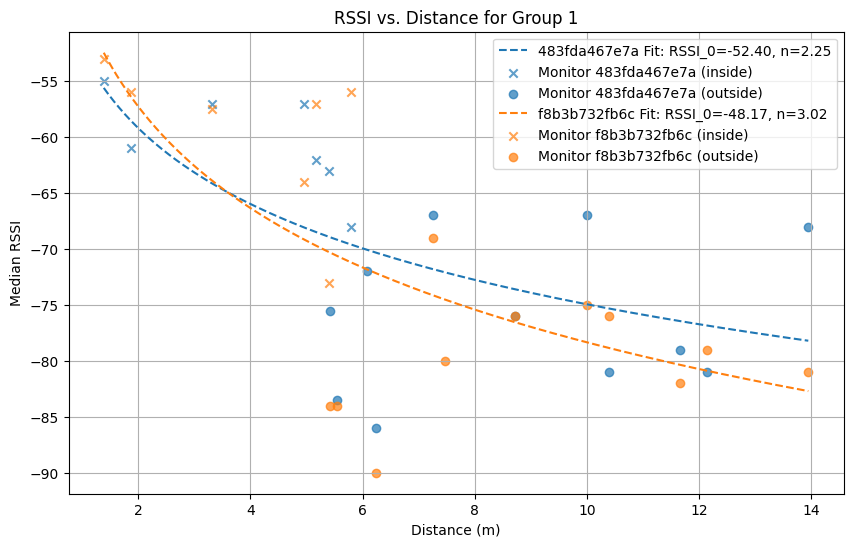

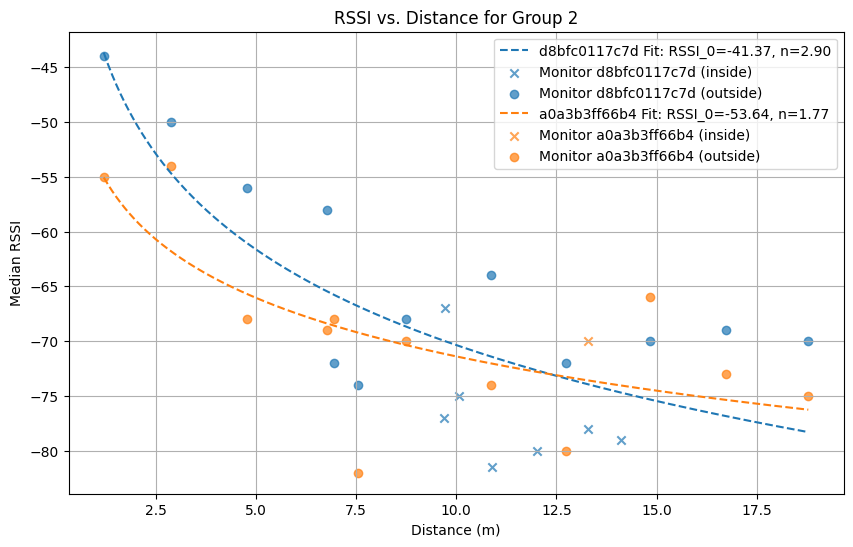

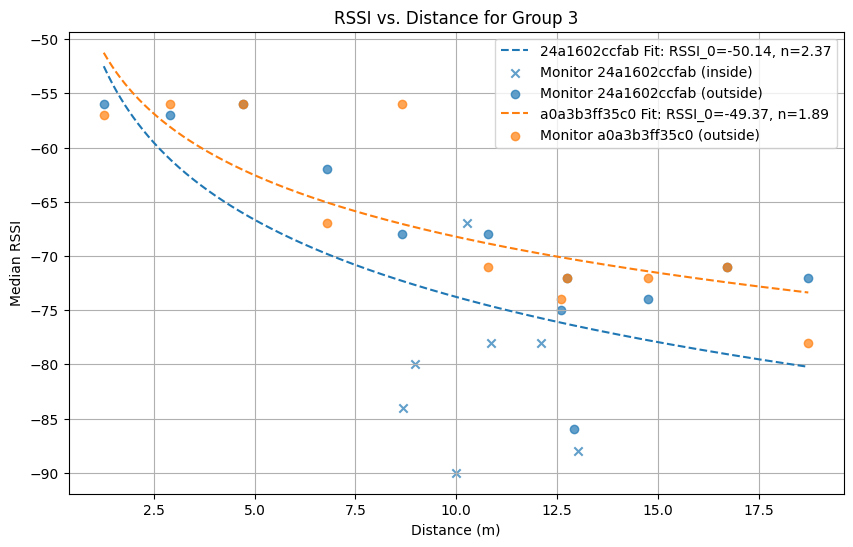

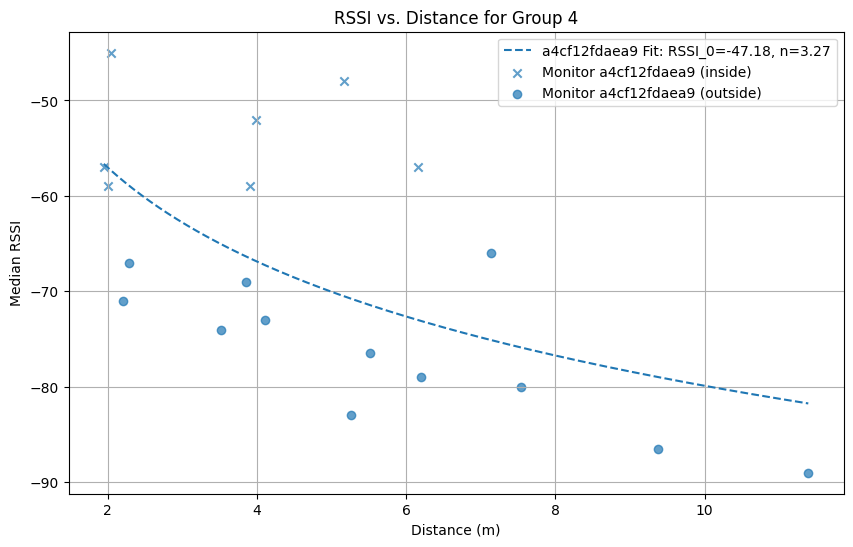

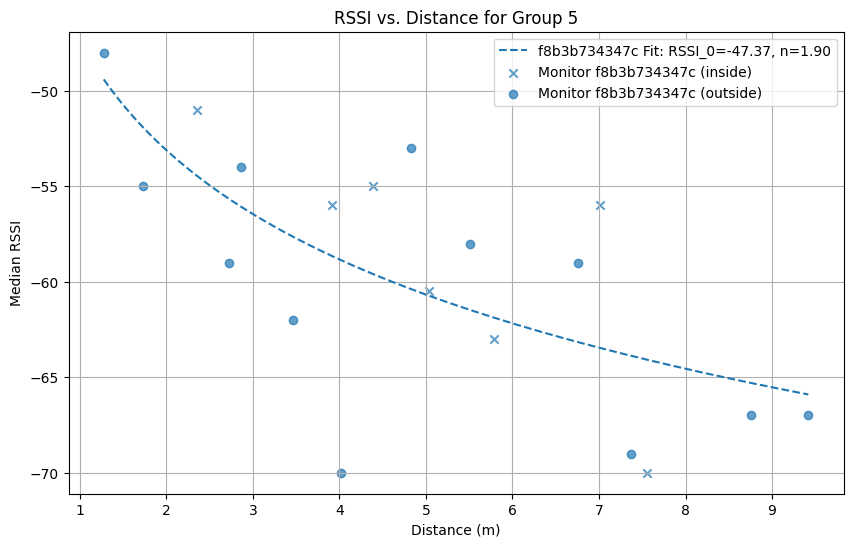

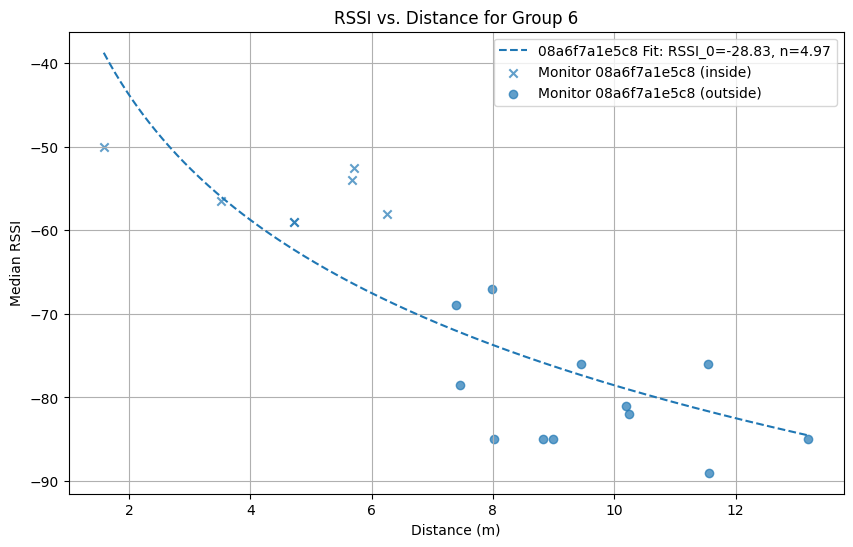

In [61]:
df = pd.read_csv("./data/filtered/apb/P20_Pro_eval.csv")
plot_rssi_vs_distance(df, True)

In [62]:
monitor_path_loss_parameters

{'483fda467e7a': (-52.39781460966696, 2.254395008201414),
 'f8b3b732fb6c': (-48.17195376460479, 3.0170694040772874),
 'd8bfc0117c7d': (-41.36708209998106, 2.8988283499447918),
 'a0a3b3ff66b4': (-53.640324803871295, 1.7749405805659073),
 '24a1602ccfab': (-50.135375789369206, 2.3650223930359324),
 'a0a3b3ff35c0': (-49.367929776493284, 1.886458668180425),
 'a4cf12fdaea9': (-47.17919896957855, 3.2716950031377166),
 'f8b3b73303e8': (-50.274648014605326, 3.0076954063372168),
 'f8b3b734347c': (-47.37439840011054, 1.9020717805159353),
 '08a6f7a1e5c8': (-28.83498191057067, 4.970940223941271)}

C:\Users\nikok\AppData\Local\Temp\ipykernel_25408\1190414891.py:55: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([ure_all, ure_esp8266, ure_esp32],


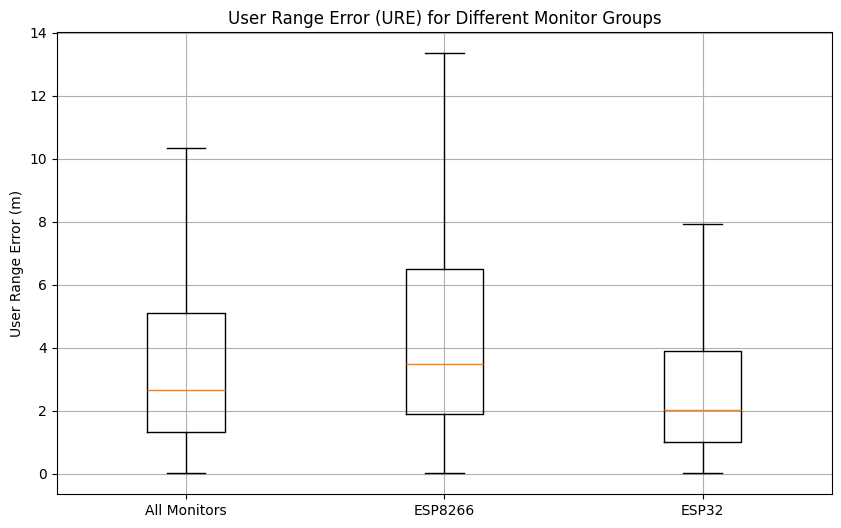

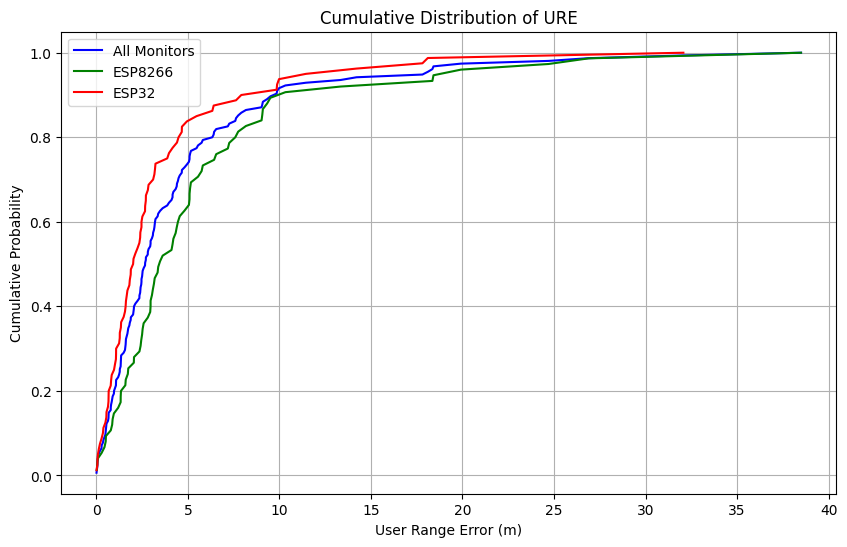

RMS for All Monitors: 7.37 meters
RMS for ESP8266: 8.59 meters
RMS for ESP32: 6.00 meters


In [64]:
def calculate_ure(df, path_loss_params):
    # Calculate the User Range Error (URE) for each target location
    ure_all = []
    ure_esp8266 = []
    ure_esp32 = []

    # Iterate over each group of monitor MACs
    for monitor_mac in df["monitor_mac"].unique():
        if monitor_mac not in path_loss_params:
            continue

        # Filter data for the current monitor
        monitor_data = df[df["monitor_mac"] == monitor_mac]
        
        # Get unique target locations
        target_locations = monitor_data[["target_position_x", "target_position_y"]].drop_duplicates()
        
        for _, target_location in target_locations.iterrows():
            target_x = target_location["target_position_x"]
            target_y = target_location["target_position_y"]
            
            # Filter data for the current target location
            target_data = monitor_data[
                (monitor_data["target_position_x"] == target_x) & 
                (monitor_data["target_position_y"] == target_y)
            ]

            ground_truth_distance = np.sqrt(
                (target_x - target_data["anchor_position_x"].iloc[0])**2 + 
                (target_y - target_data["anchor_position_y"].iloc[0])**2
            ) / 100.0  # Convert from cm to m
            
            # Calculate the median RSSI
            median_rssi = target_data["rssi"].median()

            # Retrieve the path loss model parameters for the monitor
            rssi_0, n = path_loss_params[monitor_mac]
            # Calculate the estimated distance using the path loss model
            estimated_distance = 10 ** ((rssi_0 - median_rssi) / (10 * n))
            ure = abs(ground_truth_distance - estimated_distance)
            
            # Categorize the URE values into respective groups
            if monitor_mac in monitor_macs_esp8266:
                ure_esp8266.append(ure)
            elif monitor_mac in monitor_macs_esp32:
                ure_esp32.append(ure)

            ure_all.append(ure)
    
    return ure_all, ure_esp8266, ure_esp32

def plot_ure(ure_all, ure_esp8266, ure_esp32):
    # Plot the boxplots for URE
    plt.figure(figsize=(10, 6))
    plt.boxplot([ure_all, ure_esp8266, ure_esp32], 
                labels=["All Monitors", "ESP8266", "ESP32"], 
                showfliers=False)  # Disable rendering of outliers
    plt.title("User Range Error (URE) for Different Monitor Groups")
    plt.ylabel("User Range Error (m)")
    plt.grid(True)
    plt.show()
    
    # Sort the URE values for cumulative plotting
    ure_all_sorted = np.sort(ure_all)
    ure_esp8266_sorted = np.sort(ure_esp8266)
    ure_esp32_sorted = np.sort(ure_esp32)
    
    # Calculate the cumulative distribution
    cdf_all = np.arange(1, len(ure_all_sorted) + 1) / len(ure_all_sorted)
    cdf_esp8266 = np.arange(1, len(ure_esp8266_sorted) + 1) / len(ure_esp8266_sorted)
    cdf_esp32 = np.arange(1, len(ure_esp32_sorted) + 1) / len(ure_esp32_sorted)

    # Plot the CDF for all monitors and the two groups
    plt.figure(figsize=(10, 6))
    plt.plot(ure_all_sorted, cdf_all, label="All Monitors", color='b')
    plt.plot(ure_esp8266_sorted, cdf_esp8266, label="ESP8266", color='g')
    plt.plot(ure_esp32_sorted, cdf_esp32, label="ESP32", color='r')

    # Add legend
    plt.legend()

    # Limit the x-axis to 100 meters
    # plt.xlim(0, 100)

    plt.title("Cumulative Distribution of URE")
    plt.xlabel("User Range Error (m)")
    plt.ylabel("Cumulative Probability")
    plt.grid(True)
    plt.show()

# Example usage
ure_all, ure_esp8266, ure_esp32 = calculate_ure(df, monitor_path_loss_parameters)
plot_ure(ure_all, ure_esp8266, ure_esp32)

def calculate_rms(ure_values):
    """Calculate the Root Mean Square (RMS) of the URE values."""
    return np.sqrt(np.mean(np.square(ure_values)))

# Calculate the RMS for each group
rms_all = calculate_rms(ure_all)
rms_esp8266 = calculate_rms(ure_esp8266)
rms_esp32 = calculate_rms(ure_esp32)
# Print the RMS values
print(f"RMS for All Monitors: {rms_all:.2f} meters")
print(f"RMS for ESP8266: {rms_esp8266:.2f} meters")
print(f"RMS for ESP32: {rms_esp32:.2f} meters")